In 1.SampleStreetNetwork.Ipynb:
- Random locations on the street network of Manchester are selected. At each location, four images are sampled from Google Street View pointing in the four Cardinal directions.  

In 2.CalculateEmbeddings.Ipynb :
- An embedding is calculated for each of the four locations.

This results in a dataframe containing one row per location sampled on the road network. This contains:
- A column called Image_files which contains a list of file paths of four images
- A column called Embedding which contains a list of embeddings of those four images

The aim of this project is to train a machine learning model, which will be able to predict the imd ranking of an LSOA.

LOCATION|MEAN EMBEDDING ACROSS 4 IMAGES|LSOACD|IMD RANK

In [1]:
import pickle
import os
import pandas as pd
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, LineString
import random 
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity
from scipy.stats import ttest_ind

import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations

In [2]:
data_dir = os.path.join("../../data/embeddings/")
lsoas_file = os.path.join("../../data/SpatialData/", "LSOAs_2011", "LSOA_2011_EW_BSC_V4.shp")

In [26]:
def find_optimal_k(all_embeddings):
    # --- Range of cluster counts to test ---
    n_samples = len(all_embeddings)
    max_k = min(20, n_samples - 1)
    k_values = range(2, max_k + 1)

    inertias = []
    sil_scores = []

    for k in k_values:
        print(k)
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(all_embeddings)

        inertias.append(kmeans.inertia_)
        sil_scores.append(silhouette_score(all_embeddings, labels))
        print(silhouette_score(all_embeddings, labels))
    best_k = k_values[np.argmax(sil_scores)]
    return best_k

def plot_example_images_per_cluster(df, k, n_show=5):
    fixed_rows, fixed_cols = 2, 6  # always 6 spaces total

    for c in range(k):
        cluster_imgs = df.loc[df['scene_cluster'] == c, 'image_files']
        if len(cluster_imgs) == 0:
            continue

        # Sample up to n_show images
        sample_imgs = random.sample(list(cluster_imgs), min(n_show, len(cluster_imgs)))

        fig, axes = plt.subplots(fixed_rows, fixed_cols, figsize=(fixed_cols * 3, fixed_rows * 3))
        axes = np.array(axes).reshape(-1)  # flatten axes for easy indexing

        for ax, img_path in zip(axes, sample_imgs):
            # adj_path = img_path.replace("airbnb-manchester/", "embeddings/").replace("../", "../../")
            try:
                adj_path = img_path.replace("../data/airbnb-manchester/street_images/", "../../data/embeddings/saliency_heatmaps/").replace("heatmaps/point", "heatmaps/attn_point")
                adj_path = adj_path.replace(".jpg", ".jpg.png")
                img = plt.imread(adj_path)
                ax.imshow(img)
                ax.axis("off")
            except:
                print("image not found")

        # Hide any unused subplot spaces
        for ax in axes[len(sample_imgs):]:
            ax.axis("off")

        plt.suptitle(f"Global Cluster {c}", fontsize=14, fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()
        
def lsoa_within_between_summary(expanded_gdf):
    results = []

    for lsoa, df_lsoa in expanded_gdf.groupby('LSOA11CD'):
        embeddings = np.stack(df_lsoa['embedding'].values)
        clusters = df_lsoa['scene_cluster'].values
        n_total = len(embeddings)

        if n_total < 2:
            results.append({
                'LSOA11CD': lsoa,
                'mean_within': np.nan,
                'mean_between': np.nan,
                'within_minus_between': np.nan,
                'n_images': n_total
            })
            continue

        sim_matrix = cosine_similarity(embeddings)
        within_sims = []
        between_sims = []

        for i, j in combinations(range(n_total), 2):
            sim = sim_matrix[i, j]
            if clusters[i] == clusters[j]:
                within_sims.append(sim)
            else:
                between_sims.append(sim)

        mean_within = np.mean(within_sims) if within_sims else np.nan
        mean_between = np.mean(between_sims) if between_sims else np.nan
        within_minus_between = mean_within - mean_between if mean_within is not np.nan and mean_between is not np.nan else np.nan

        results.append({
            'LSOA11CD': lsoa,
            'mean_within': mean_within,
            'mean_between': mean_between,
            'within_minus_between': within_minus_between,
            'n_images': n_total})

    df_results = pd.DataFrame(results)

    # Check for LSOAs where between > within
    anomalies = df_results[df_results['within_minus_between'] < 0]
    n_anomalies = len(anomalies)
    if n_anomalies > 0:
        print(f"Warning: {n_anomalies} LSOAs have higher between-cluster similarity than within-cluster similarity.")
    else:
        print("All LSOAs have higher within-cluster similarity than between-cluster similarity.")

    return df_results

def mean_embedding_per_cluster(expanded_gdf, K, embedding_col):
    """
    Compute mean embedding per cluster for each LSOA.
    
    Parameters:
    - expanded_gdf: DataFrame with columns 'LSOA11CD', 'embedding', 'scene_cluster'
    - K: total number of clusters (0 to K-1)
    
    Returns:
    - DataFrame with one row per LSOA, columns: 'cluster_0', 'cluster_1', ..., 'cluster_{K-1}'
      Each cell contains the mean embedding vector for that cluster, or np.nan if no images in cluster.
    """
    results = []

    for lsoa, df_lsoa in expanded_gdf.groupby('LSOA11CD'):
        row = {'LSOA11CD': lsoa}
        for k in range(K):
            cluster_embeddings = df_lsoa.loc[df_lsoa['scene_cluster'] == k, embedding_col].values
            if len(cluster_embeddings) == 0:
                row[f'cluster_{k}'] = np.nan  # no images in this cluster
            else:
                row[f'cluster_{k}'] = np.mean(np.stack(cluster_embeddings), axis=0)
        results.append(row)

    return pd.DataFrame(results)

def weighted_mean_embedding_per_cluster(expanded_gdf, K, embedding_col):
    """
    Compute weighted mean embedding per LSOA, where each cluster is weighted by its proportion of images.
    
    Parameters:
    - expanded_gdf: DataFrame with columns 'LSOA11CD', 'embedding', 'scene_cluster'
    - K: total number of clusters (0 to K-1)
    - embedding_col: column containing 1D embedding arrays
    
    Returns:
    - DataFrame with one row per LSOA, columns: 'weighted_embedding'
      Each row contains a single weighted embedding vector for the LSOA.
    """
    results = []

    for lsoa, df_lsoa in expanded_gdf.groupby('LSOA11CD'):
        n_total = len(df_lsoa)  # total images in LSOA
        weighted_sum = None

        for k in range(K):
            cluster_embeddings = df_lsoa.loc[df_lsoa['scene_cluster'] == k, embedding_col].values
            n_cluster = len(cluster_embeddings)

            if n_cluster == 0:
                continue  # weight = 0 for missing clusters

            cluster_mean = np.mean(np.stack(cluster_embeddings), axis=0)
            weight = n_cluster / n_total

            if weighted_sum is None:
                weighted_sum = weight * cluster_mean
            else:
                weighted_sum += weight * cluster_mean

        results.append({'LSOA11CD': lsoa, 'weighted_embedding': weighted_sum})

    return pd.DataFrame(results)

def cluster_embeddings_with_proportions(expanded_gdf, K, embedding_col):
    """
    Compute weighted mean embedding per cluster and cluster proportions for each LSOA.
    
    Parameters:
    - expanded_gdf: DataFrame with columns 'LSOA11CD', 'embedding', 'scene_cluster'
    - K: total number of clusters (0 to K-1)
    - embedding_col: column containing 1D embedding arrays
    
    Returns:
    - DataFrame with one row per LSOA
      - Columns 'cluster_{k}_embedding': mean embedding of cluster k (NaN if missing)
      - Columns 'cluster_{k}_proportion': fraction of images in cluster k
    """
    results = []

    for lsoa, df_lsoa in expanded_gdf.groupby('LSOA11CD'):
        n_total = len(df_lsoa)
        row = {'LSOA11CD': lsoa}

        for k in range(K):
            cluster_embeddings = df_lsoa.loc[df_lsoa['scene_cluster'] == k, embedding_col].values
            n_cluster = len(cluster_embeddings)
            
            # proportion of images in this cluster
            row[f'cluster_{k}_proportion'] = n_cluster / n_total if n_total > 0 else 0.0

            if n_cluster == 0:
                row[f'cluster_{k}_embedding'] = np.nan  # or np.zeros(embedding_dim) if preferred
            else:
                cluster_mean = np.mean(np.stack(cluster_embeddings), axis=0)
                row[f'cluster_{k}_embedding'] = cluster_mean

        results.append(row)

    return pd.DataFrame(results)

def flatten_weighted_cluster_features(df_lsoa_features, K, embedding_dim):
    """
    Convert per-cluster embeddings and proportions into a single ML-ready feature vector.
    
    Parameters:
    - df_lsoa_features: output of cluster_embeddings_with_proportions()
    - K: number of clusters
    - embedding_dim: dimension of each embedding vector
    
    Returns:
    - X: DataFrame, one row per LSOA, columns = weighted embeddings + optional proportions
    """
    rows = []
    for _, row in df_lsoa_features.iterrows():
        features = []

        for k in range(K):
            # get cluster proportion
            prop = row[f'cluster_{k}_proportion']
            
            # get cluster embedding, fill NaN with zeros
            emb = row[f'cluster_{k}_embedding']
            if emb is None or (isinstance(emb, float) and np.isnan(emb)):
                emb = np.zeros(embedding_dim)
            
            # weighted embedding
            weighted_emb = prop * np.array(emb)
            features.extend(weighted_emb)
            
            # optionally, also include proportion explicitly
            features.append(prop)

        rows.append(features)

    X = pd.DataFrame(rows, index=df_lsoa_features['LSOA11CD'])
    return X

### Get spatial data

In [4]:
lsoas =  gpd.read_file(lsoas_file)
manc_lads = ['Manchester', 'Rochdale', 'Bolton', 'Bury', 'Wigan', 'Oldham',  'Trafford', 'Salford', 'Tameside', 'Stockport']
manc_lads_pattern = '|'.join(manc_lads)
gm_lsoa=lsoas[lsoas['LSOA11NMW'].str.contains(manc_lads_pattern)]
gm_lsoa = gm_lsoa.to_crs(epsg=4326)

### Get embeddings (four per location)

In [5]:
points_data_cache = data_dir + "points_with_embeddings.pkl"
with open(points_data_cache, "rb") as f:
    point_records = pickle.load(f)

### Join image embeddings points to gentrification LSOAs

In [6]:
point_coords = [Point(rec['longitude'], rec['latitude']) for rec in point_records]
points_labels_gdf = gpd.GeoDataFrame(point_records, geometry=point_coords, crs="EPSG:4326")

# Perform spatial join to get gentrification label for each point
points_labels_gdf = gpd.sjoin(points_labels_gdf, gm_lsoa, how='inner', predicate='within')
# sjoin may add an index from the polygon ('index_right'); we can drop it
if 'index_right' in points_labels_gdf.columns:
    points_labels_gdf = points_labels_gdf.drop(columns=['index_right'])

print(f"Points after spatial join: {len(points_labels_gdf)} / {len(point_records)}"
      f" `(some points may lie outside the label polygons and were dropped)")

Points after spatial join: 18897 / 18897 `(some points may lie outside the label polygons and were dropped)


# 1. Find mean embedding at each location.

In [7]:
points_labels_gdf["mean_embedding"] = points_labels_gdf["embedding"].apply(
    lambda emb_list: np.mean(np.stack(emb_list), axis=0)) 

In [8]:
points_labels_gdf[['LSOA11CD', 'mean_embedding']].to_pickle(data_dir + "mean_embeddings_per_location.pkl")

# 2. Find mean embedding in LSOA based on mean at each location.

In [9]:
def mean_embed(x):
    return np.mean(np.vstack(x), axis=0)

avg_embeddings = (points_labels_gdf.groupby("LSOA11CD")["mean_embedding"]
      .apply(mean_embed)
      .reset_index())

avg_embeddings.to_pickle(data_dir + "mean_embeddings_per_lsoa_from_mean.pkl")

# 3. Find mean emedding in LSOA based on all 4 images at each location

### Create dataframe with one row per embedding (Instead of four embeddings per row)

In [10]:
expanded_rows = []

for _, row in points_labels_gdf.iterrows():
    embeddings = row['embedding']      # list of 4 embeddings
    images = row['image_files']        # list of 4 image paths

    # Skip if lengths don't match
    if len(embeddings) != len(images):
        print(f"Skipping row {row.name}: {len(embeddings)} embeddings, {len(images)} images")
        continue

    for emb, img in zip(embeddings, images):
        new_row = row.to_dict()        # copy all other columns
        new_row['embedding'] = emb     # single embedding
        new_row['image_files'] = img    # single image
        expanded_rows.append(new_row)

# Create new DataFrame
expanded_gdf = pd.DataFrame(expanded_rows)
print(f"Original rows: {len(points_labels_gdf)}, Expanded rows: {len(expanded_gdf)}")
expanded_gdf = pd.DataFrame(expanded_rows)

Skipping row 9158: 3 embeddings, 4 images
Skipping row 18664: 3 embeddings, 4 images
Original rows: 18897, Expanded rows: 75580


### Find the mean embedding in each LSOA

In [11]:
avg_embeddings = (
    expanded_gdf.groupby("LSOA11CD")["embedding"]
      .apply(mean_embed)
      .reset_index())

avg_embeddings.to_pickle(data_dir + "mean_embeddings_per_lsoa.pkl")

# 4. Find mean embedding per image type in each LSOA 

### Run a PCA to reduce embedding dimensionality

In [12]:
all_embeddings = np.stack(expanded_gdf['embedding'].values)
pca = PCA(n_components=50, random_state=42)
reduced_embeddings = pca.fit_transform(all_embeddings)
print(f"Explained variance by 20 components: {pca.explained_variance_ratio_.sum():.2f}")
# set back on dataframe
expanded_gdf['embedding_reduced'] = list(reduced_embeddings)

Explained variance by 20 components: 0.65


### Run cluster analysis on reduced embeddings

In [13]:
# find_optimal_k(reduced_embeddings)

In [14]:
k = 8  # e.g., parks, houses, roads, industrial, water
kmeans = KMeans(n_clusters=k, random_state=42)
all_embeddings = np.stack(expanded_gdf['embedding_reduced'].values)
expanded_gdf['scene_cluster'] = kmeans.fit_predict(all_embeddings)

### Check images to see whether clustering is logical (to me)

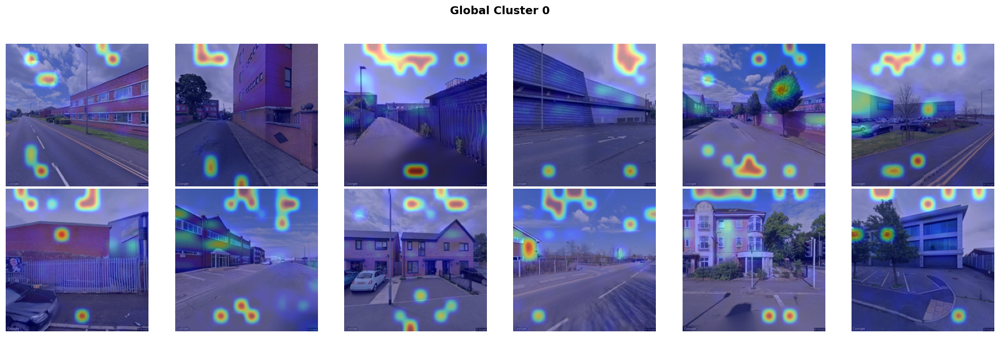

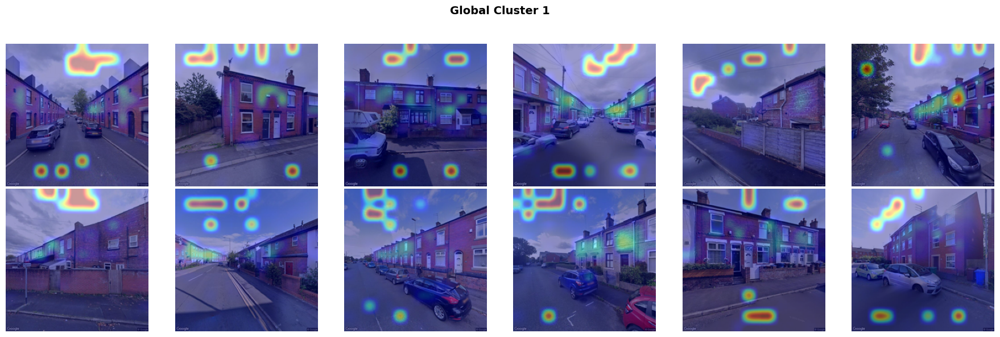

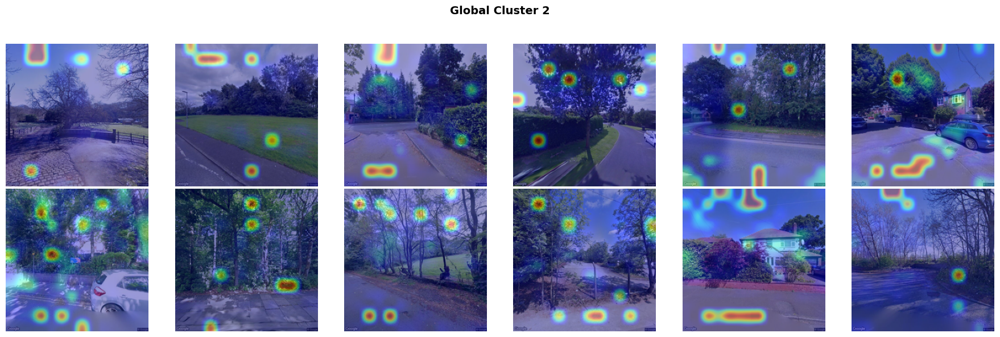

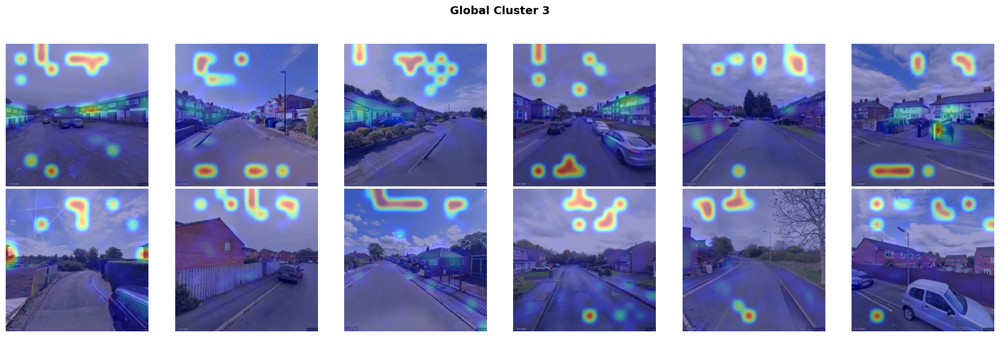

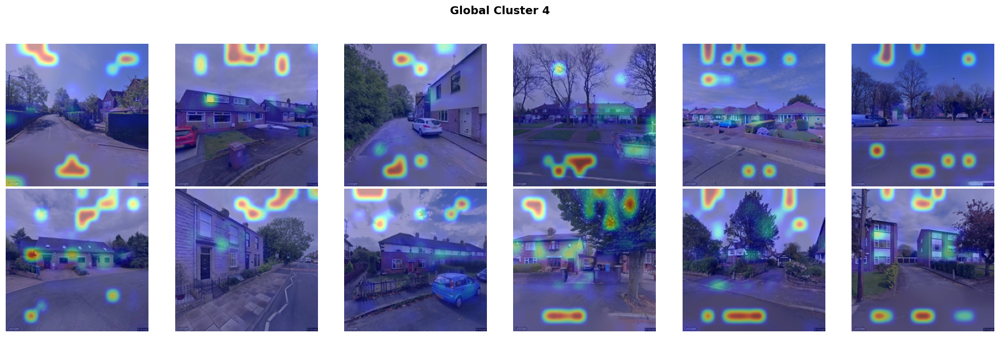

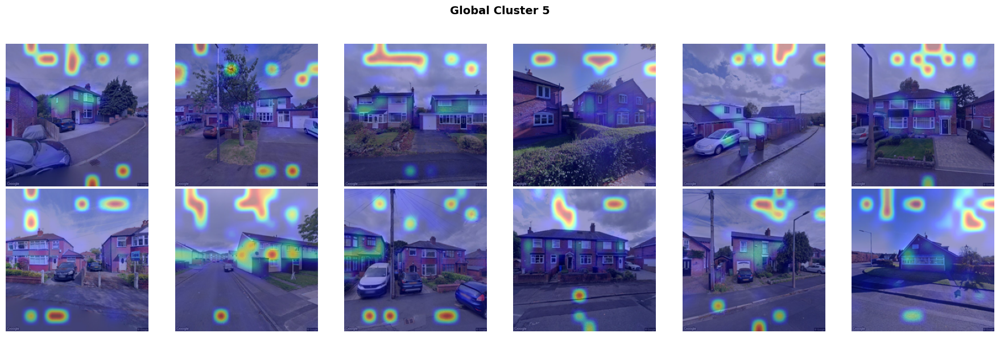

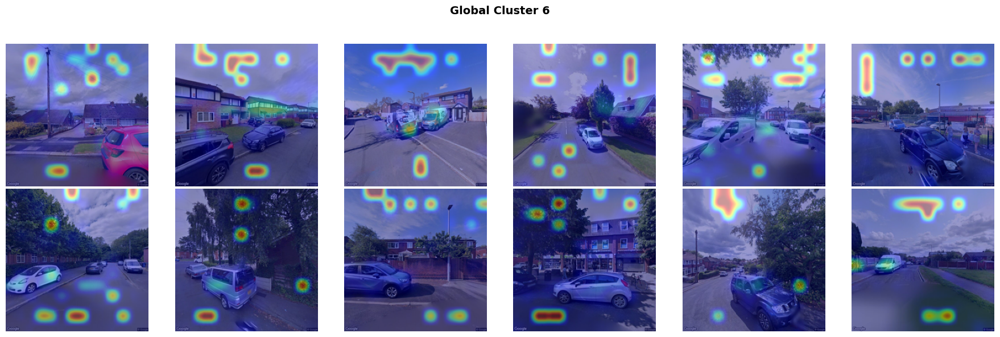

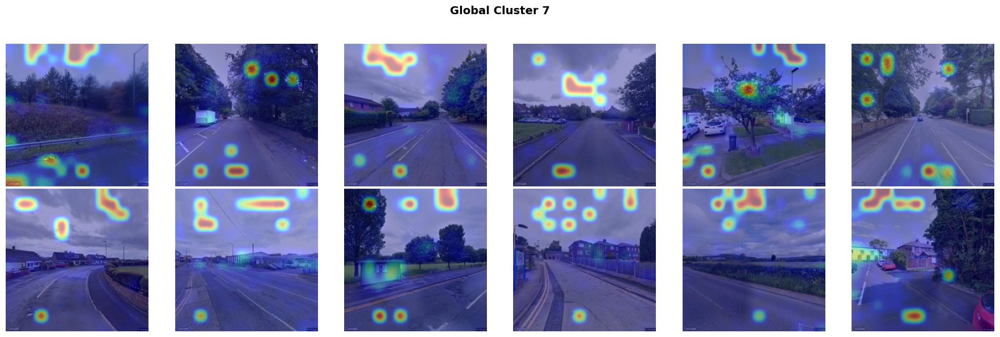

In [15]:
plot_example_images_per_cluster(expanded_gdf, k, n_show=12)

### For each LSOA, compare between and within cluster group similarity

In [16]:
lsoa_sim_df = lsoa_within_between_summary(expanded_gdf)
lsoa_sim_df.head()

,LSOA11CD,mean_within,mean_between,within_minus_between,n_images
0,E01004766,0.569487,0.357428,0.212058,64
1,E01004767,0.513547,0.328592,0.184955,72
2,E01004768,0.628970,0.389832,0.239138,56
3,E01004769,0.462095,0.293362,0.168733,36
4,E01004770,0.579001,0.351007,0.227994,40


### For each LSOA, calculate mean embedding in each cluster

In [31]:
K = expanded_gdf['scene_cluster'].max() + 1  # number of clusters
lsoa_cluster_means_df = mean_embedding_per_cluster(expanded_gdf, K, 'embedding_reduced')
lsoa_cluster_weighted_means_df = weighted_mean_embedding_per_cluster(expanded_gdf, 5, 'embedding')

In [18]:
lsoa_cluster_weighted_means_df = cluster_embeddings_with_proportions(expanded_gdf, 5, 'embedding')
embedding_dim = 768
X_ml = flatten_weighted_cluster_features(lsoa_cluster_weighted_means_df, K=5, embedding_dim=embedding_dim)

In [25]:
# Assume df_lsoa_features is output of cluster_embeddings_with_proportions
embedding_dim = 768
X_ml = flatten_weighted_cluster_features(lsoa_cluster_weighted_means_df, K=5, embedding_dim=embedding_dim)

In [20]:
X_ml.to_pickle(data_dir + "xml.pkl")

In [33]:
lsoa_cluster_means_df.to_pickle(data_dir + "global_clusters_mean_embeddings.pkl")
lsoa_cluster_weighted_means_df.to_pickle(data_dir + "global_clusters_weighted_mean_embeddings.pkl")

### Keep only LSOAs where no cluster embedding is missing

In [22]:
# cluster_cols = [f'cluster_{k}' for k in range(K)]
# complete_lsoas_df = lsoa_cluster_means_df.dropna(subset=cluster_cols)

# print(f"Kept {len(complete_lsoas_df)} LSOAs out of {len(lsoa_cluster_means_df)} that have all clusters present")

In [23]:
lsoa_cluster_means_df.to_pickle(data_dir + "global_clusters_mean_embeddings.pkl")